# Simulating different image modalities with `DeepTrack2`

This tutorial will demonstrate how to simulate a spherical particle with different image modalities as well as how to generate a movie where this particle diffuses with passive Brownian motion.

In [2]:
import numpy as np
import deeptrack as dt
from matplotlib import pyplot as plt
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

from deeptrack.backend import xp
from deeptrack.backend.units import ConversionTable
from deeptrack.optical.scatterers import VolumeScatterer
from deeptrack import units as u


Define helper functions.

In [3]:
def complex_to_float_f():
    """Converts a complex image to a float image, needed for Holography."""
    def inner(image):
        image = image - 1
        output = np.zeros((*image.shape[:2], 2))
        output[..., 0:1] = np.real(image)
        output[..., 1:2] = np.imag(image)
        return output
    return inner
complex_to_float = dt.Lambda(complex_to_float_f)

def simulate_passive_brownian_trajectories(
        random_seed=None,
        IMAGE_SIZE=256,
        length=1000
    ):
    if random_seed is not None:
        np.random.seed(random_seed)
    x_positions = []
    y_positions = []
    dx, dy, dz = IMAGE_SIZE//2, IMAGE_SIZE//2, 2

    for t in range(length):
        x_positions.append(dx)
        y_positions.append(dy)

        dx += np.random.standard_normal() * 1
        dy += np.random.standard_normal() * 1

    return x_positions, y_positions, dx, dy, dz


def simulate_active_brownian_trajectories(
        random_seed=None,
        IMAGE_SIZE=256,
        length=1000,
        velocity=0.25,
        rotational_diffusion=0.09,
        translational_diffusion=0.5,
    ):
    if random_seed is not None:
            np.random.seed(random_seed)

    dx, dy, dz = IMAGE_SIZE//2, IMAGE_SIZE//2, 2
    theta = np.random.uniform(0, 2*np.pi)
    
    x_positions = []
    y_positions = []
    for t in range(movie_length):

        x_positions.append(dx)
        y_positions.append(dy)

        theta += np.random.normal(0, rotational_diffusion)

        dx += velocity * np.cos(theta) + np.random.normal(0, translational_diffusion)
        dy += velocity * np.sin(theta) + np.random.normal(0, translational_diffusion)

        if dx < 0 or dx > IMAGE_SIZE:
            theta = np.pi - theta
            dx = np.clip(dx, 0, IMAGE_SIZE)

        if dy < 0 or dy > IMAGE_SIZE:
            theta = -theta
            dy = np.clip(dy, 0, IMAGE_SIZE)
    return x_positions, y_positions, dx, dy, dz


## Simulating passive Brownian motion in various modalities

c:\Users\xlecal\Desktop\student-teacher-tracking\.venv\Lib\site-packages\deeptrack\optical\optics.py:1878: UserWarning: Brightfield imaging from ScatteredVolume assumes a weak-phase / projection approximation. Use ScatteredField for physically accurate brightfield simulations.
  warnings.warn(
c:\Users\xlecal\Desktop\student-teacher-tracking\.venv\Lib\site-packages\deeptrack\optical\optics.py:1418: UserWarning: Scatterer defines 'refractive_index', which is ignored in fluorescence microscopy.
  warnings.warn(
c:\Users\xlecal\Desktop\student-teacher-tracking\.venv\Lib\site-packages\deeptrack\optical\optics.py:1429: UserWarning: Fluorescence scatterer has no 'intensity'. Interpreting 'value' as a non-physical brightness factor. Quantitative interpretation is invalid. Define 'intensity' to model physical fluorescence emission.
  warnings.warn(


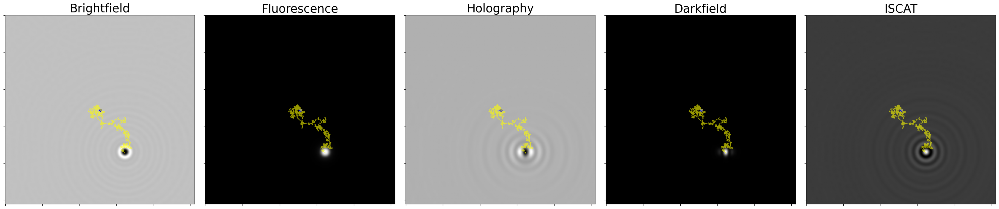

In [55]:
random_seed = 42
IMAGE_SIZE = 256

wavelengths = np.linspace(450e-9, 800e-9, 5)
movie_length = 1000

x_positions, y_positions, dx, dy, dz = simulate_passive_brownian_trajectories(
    random_seed=random_seed,
    IMAGE_SIZE=IMAGE_SIZE,
    length=movie_length
)

# Scatterer for Brightfield, Fluorescence
particle = dt.Sphere(
    position=(dy, dx, dz) * dt.units.pixel,
    radius=0.3e-6,
    refractive_index=1.42,
    position_unit="pixel",
    L=10,
)

# Mie particle for Holography, ISCAT, Darkfield.
mie_particle = dt.MieSphere(
    position=(dy, dx, dz) * dt.units.pixel,
    radius=60e-9,
    position_unit="pixel",
    refractive_index=1.42,
    L=10,
)

# Image particle with Brightfield, sample multiple wavelengths.
brightfield_images = []
for wavelength in wavelengths:
    optics = dt.Brightfield(
        resolution=1e-6,
        magnification=12,
        wavelength=wavelength,
        padding=(32, 32, 32, 32),
        output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    )
    brightfield_images.append(optics(particle))
brightfield_image = (sum(brightfield_images) / len(brightfield_images)).resolve()

# Image particle with Fluorescence (single wavelength).
fluorescence_optics = dt.Fluorescence(
    NA=1.4,
    resolution=1e-6,
    magnification=20,
    wavelength=600e-9,
    padding=(32, 32, 32, 32),
    output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
)
fluorescence_image = fluorescence_optics(particle).resolve()

# Image particle with Darkfield, sample multiple wavelengths.
darkfield_images = []
for wavelength in wavelengths:
    optics = dt.Darkfield(
        resolution=1e-6,
        magnification=16,
        wavelength=wavelength,
        padding=(32, 32, 32, 32),
        output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    )
    darkfield_images.append(optics(mie_particle))
darkfield_image = (sum(darkfield_images) / len(darkfield_images)).resolve()


# Image particle with Holography.
holography_microscope = dt.Holography(
    resolution=1e-6,
    magnification=12,
    wavelength=600e-9,
    padding=(32, 32, 32, 32),
    output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    return_field=True,
)
holography_complex = holography_microscope(mie_particle).resolve()

# Convert complex-valued image to float to display image
converted_image = complex_to_float(holography_complex)

real = converted_image[:, :, 0]
imag = converted_image[:, :, 1]
holography_image = real + imag

# Image particle with ISCAT.
iscat_microscope = dt.ISCAT(
    resolution=1e-6,
    magnification=14,
    wavelength=450e-9,
    padding=(32, 32, 32, 32),
    output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
)
iscat_image = iscat_microscope(mie_particle).resolve()

images = [
    brightfield_image,
    fluorescence_image,
    holography_image,
    darkfield_image,
    iscat_image,
]
titles = [
    "Brightfield",
    "Fluorescence",
    "Holography",
    "Darkfield",
    "ISCAT",
]

fig, axes = plt.subplots(
    1, 5,
    figsize=(30, 6),
    sharex=True,
    sharey=True
)

for ax, img, title in zip(axes, images, titles):

    ax.imshow(img, cmap="gray", origin="upper")

    ax.plot(
        x_positions,
        y_positions,
        lw=1.2,
        alpha=0.6,
        color="yellow"
    )
    ax.scatter(
        x_positions[0],
        y_positions[0],
        c="blue",
        s=30,
        label="Origin",
        marker="o"
    )

    ax.set_title(title, fontsize=25), ax.tick_params(labelleft=False, labelbottom=False)

#axes[0].set_ylabel("y [Pixel]", fontsize=15)
#axes[0].set_xlabel("x [Pixel]", fontsize=15)
axes[0].tick_params(labelbottom=False, labelleft=False)

handles, labels = axes[0].get_legend_handles_labels()
#fig.legend(
#    handles,
#    labels,
#    loc="upper left",
#    bbox_to_anchor=(0.002, 1.09),
#    fontsize=17
#)

plt.tight_layout()
plt.savefig(
    "fig2a.svg",
    format="svg",
    bbox_inches="tight",
    pad_inches=0.2
)
plt.show()

## Make Fluorescent Janus particle

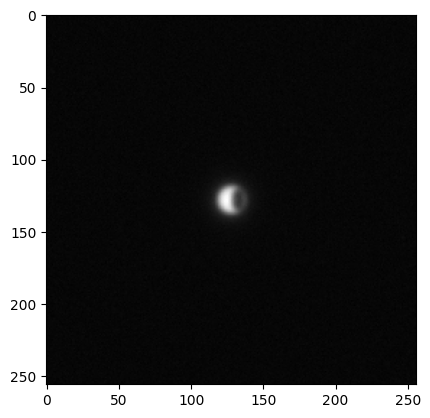

In [5]:
outer = dt.Sphere(
    position=(IMAGE_SIZE//2, IMAGE_SIZE//2, dz) * dt.units.pixel,
    radius=0.5e-6,
    refractive_index=1.42,
    position_unit="pixel",
    L=10,
    intensity=1
)
inner = dt.Ellipsoid(
    position=(IMAGE_SIZE//2, IMAGE_SIZE//2 + 4, dz) * dt.units.pixel,
    radius=(0.25e-6, 0.4e-6,),
    refractive_index=1.42,
    position_unit="pixel",
    L=10,
    intensity=-1.5,
)
combined = outer >> inner
img = (fluorescence_optics(combined) >> dt.Gaussian(0, 0.003)).update().new()
plt.imshow(img, cmap="gray")

c:\Users\xlecal\Desktop\student-teacher-tracking\.venv\Lib\site-packages\deeptrack\optical\optics.py:1878: UserWarning: Brightfield imaging from ScatteredVolume assumes a weak-phase / projection approximation. Use ScatteredField for physically accurate brightfield simulations.
  warnings.warn(
c:\Users\xlecal\Desktop\student-teacher-tracking\.venv\Lib\site-packages\deeptrack\optical\optics.py:1899: UserWarning: Scatterer defines 'intensity', which is ignored in brightfield microscopy.
  warnings.warn(
c:\Users\xlecal\Desktop\student-teacher-tracking\.venv\Lib\site-packages\deeptrack\optical\optics.py:1418: UserWarning: Scatterer defines 'refractive_index', which is ignored in fluorescence microscopy.
  warnings.warn(


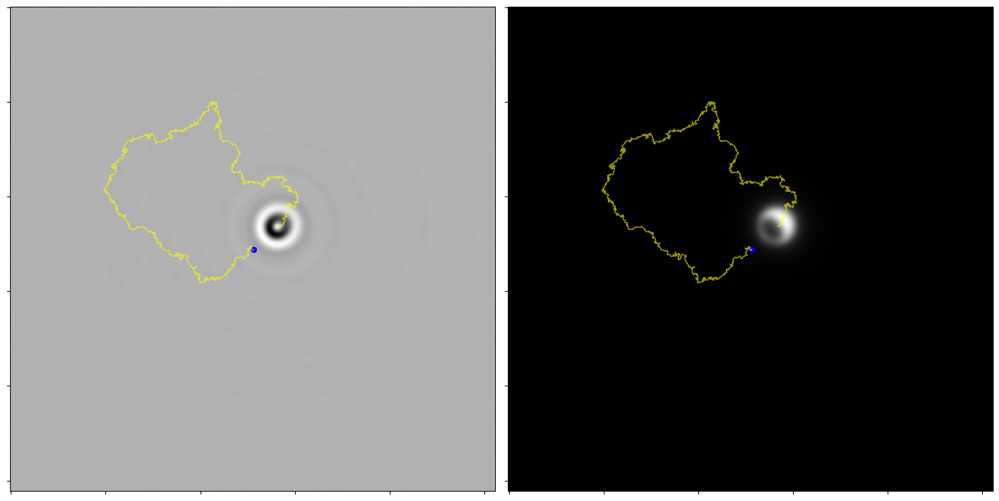

In [54]:
random_seed = 42
IMAGE_SIZE = 256

x_positions = []
y_positions = []

dx, dy, dz = IMAGE_SIZE//2, IMAGE_SIZE//2, 2
movie_length = 1200

velocity = 0.25
rotational_diffusion = 0.09
translational_diffusion = 0.5

x_positions, y_positions, dx, dy, dz = simulate_active_brownian_trajectories(
    random_seed=random_seed,
    IMAGE_SIZE=IMAGE_SIZE,
    length=movie_length,
    velocity=0.25,
    rotational_diffusion=rotational_diffusion,
    translational_diffusion=translational_diffusion,
)



particle = dt.Sphere(
    position=(dy, dx, dz) * dt.units.pixel,
    radius=0.3e-6,
    refractive_index=1.42,
    position_unit="pixel",
    L=10,
)

outer = dt.Sphere(
    position=(dy, dx, dz) * dt.units.pixel,
    radius=0.5e-6,
    refractive_index=1.42,
    position_unit="pixel",
    L=10,
    intensity=1
)

travel_angle = np.arctan2(
    y_positions[-1] - y_positions[-2],
    x_positions[-1] - x_positions[-2]
)

offset_magnitude = 3
offset_x = offset_magnitude * np.cos(travel_angle)
offset_y = offset_magnitude * np.sin(travel_angle)

inner = dt.Ellipsoid(
    position=(dy + offset_y, dx + offset_x, dz) * dt.units.pixel,
    radius=(0.38e-6, 0.28e-6),
    refractive_index=1.42,
    position_unit="pixel",
    L=10,
    intensity=-1.4,
    rotation=travel_angle+ np.pi/2
)

combined = outer >> inner

outer_mie = dt.MieSphere(
    position=(dy, dx, dz) * dt.units.pixel,
    radius=500e-9,
    position_unit="pixel",
    refractive_index=1.42,
    L="auto",
)
inner_mie = dt.MieSphere(
    position=(dy+2, dx+2, dz) * dt.units.pixel,
    radius=150e-9,
    position_unit="pixel",
    refractive_index=0.5 + 1.9j,
    L="auto",
)
mie_particle = outer_mie

brightfield_images = []

for wavelength in wavelengths:
    optics = dt.Brightfield(
        resolution=1e-6,
        magnification=12,
        wavelength=wavelength,
        padding=(32, 32, 32, 32),
        output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    )

    brightfield_images.append(optics(combined))

brightfield_image = (sum(brightfield_images) / len(brightfield_images)).resolve()


fluorescence_optics = dt.Fluorescence(
    NA=1.4,
    resolution=1e-6,
    magnification=20,
    wavelength=600e-9,
    padding=(32, 32, 32, 32),
    output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
)

fluorescence_image = fluorescence_optics(combined).resolve()


darkfield_images = []

for wavelength in wavelengths:

    optics = dt.Darkfield(
        resolution=1e-6,
        magnification=16,
        wavelength=wavelength,
        padding=(32, 32, 32, 32),
        output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    )

    darkfield_images.append(optics(mie_particle))

darkfield_image = (sum(darkfield_images) / len(darkfield_images)).resolve()


holography_microscope = dt.Holography(
    resolution=1e-6,
    magnification=12,
    wavelength=600e-9,
    padding=(32, 32, 32, 32),
    output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    return_field=True,
)

holography_complex = holography_microscope(mie_particle).resolve()

converted_image = complex_to_float(holography_complex)
holography_real = converted_image[:, :, 0]
holography_imag = converted_image[:, :, 1]

holography_image = holography_real + holography_imag


iscat_microscope = dt.ISCAT(
    resolution=1e-6,
    magnification=14,
    wavelength=450e-9,
    padding=(32, 32, 32, 32),
    output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
)
iscat_image = iscat_microscope(mie_particle).resolve()

images = [
    brightfield_image,
    fluorescence_image,
    #holography_image,
    #darkfield_image,
    #iscat_image,
]

titles = [
    "Brightfield",
    "Fluorescence",
    #"Holography",
    #"Darkfield",
    #"ISCAT",
]

fig, axes = plt.subplots(1, 2, figsize=(15, 8))

for ax, img, title in zip(axes, images, titles):

    ax.imshow(img, cmap="gray", origin="upper")

    ax.plot(
        x_positions,
        y_positions,
        color="yellow",
        lw=1.2,
        alpha=0.6
    )

    ax.scatter(
        x_positions[0],
        y_positions[0],
        c="blue",
        s=30,
        label="Origin"
    )

    #ax.set_title(title, fontsize=17)
    ax.tick_params(labelleft=False, labelbottom=False)

#axes[0].set_ylabel("y [Pixel]", fontsize=15)
#axes[0].set_xlabel("x [Pixel]", fontsize=15)
axes[0].tick_params(labelbottom=False, labelleft=False)

handles, labels = axes[0].get_legend_handles_labels()
#fig.legend(
#    handles,
#    labels,
#    loc="upper left",
#   bbox_to_anchor=(0.002, 1.09),
#    fontsize=15
#)

plt.tight_layout()
plt.savefig(
    "fig2b.svg",
    format="svg",
    bbox_inches="tight",
    pad_inches=0.2
)
plt.show()

## Make Rod Particles

In [7]:
class Cylinder(VolumeScatterer):
    __conversion_table__ = ConversionTable(
        radius=(u.meter, u.meter),
        length=(u.meter, u.meter),
        rotation=(u.radian, u.radian),
    )

    def __init__(
        self,
        radius=0.5e-6,
        length=2e-6,
        rotation=(0, 0, 0),
        max_bacillus_bend=0,
        refractive_index=1.38,
        intensity=1,
        **kwargs
    ):
        super().__init__(
            radius=radius,
            length=length,
            rotation=rotation,
            max_bacillus_bend=max_bacillus_bend,
            refractive_index=refractive_index,
            intensity=intensity,
            **kwargs
        )

    def _process_properties(self, properties):
        properties = super()._process_properties(properties)

        radius = xp.array(properties["radius"])
        if radius.size > 1:
            radius = radius[0]
        properties["radius"] = float(radius)

        properties["length"] = float(properties["length"])

        rotation = xp.array(properties["rotation"])
        if rotation.ndim == 0:
            rotation = [rotation, 0, 0]
        elif rotation.size == 1:
            rotation = [rotation[0], 0, 0]
        elif rotation.size == 2:
            rotation = [rotation[0], rotation[1], 0]

        properties["rotation"] = tuple(rotation)

        return properties

    def get(
        self,
        *ignore,
        radius,
        length,
        rotation,
        max_bacillus_bend,
        voxel_size,
        **kwargs
    ):
        rad_ceil = xp.ceil(radius / xp.min(voxel_size[:2]))
        len_ceil = xp.ceil(length * 0.5 / voxel_size[2]) + rad_ceil
        ceil = int(max(rad_ceil, len_ceil))

        x = xp.arange(-ceil, ceil) * voxel_size[0]
        y = xp.arange(-ceil, ceil) * voxel_size[1]
        z = xp.arange(-ceil, ceil) * voxel_size[2]

        Y, X, Z = xp.meshgrid(y, x, z)

        cos = xp.cos(rotation)
        sin = xp.sin(rotation)

        XR = (
            cos[0] * cos[1] * X
            + (cos[0] * sin[1] * sin[2] - sin[0] * cos[2]) * Y
            + (cos[0] * sin[1] * cos[2] + sin[0] * sin[2]) * Z
        )

        YR = (
            sin[0] * cos[1] * X
            + (sin[0] * sin[1] * sin[2] + cos[0] * cos[2]) * Y
            + (sin[0] * sin[1] * cos[2] - cos[0] * sin[2]) * Z
        )

        ZR = (
            -sin[1] * X
            + cos[1] * sin[2] * Y
            + cos[1] * cos[2] * Z
        )

        # Wave-like bending along the cylinder
        bend_amp_x = (
            (xp.random.rand() - 0.5) * 2 * max_bacillus_bend
        )
        bend_amp_z = (
            (xp.random.rand() - 0.5) * 2 * max_bacillus_bend
        )

        lateral_offset_x = bend_amp_x * xp.cos(xp.pi * YR / length)
        lateral_offset_z = bend_amp_z * xp.cos(xp.pi * YR / length)

        XR -= lateral_offset_x
        ZR -= lateral_offset_z

        # Pure cylinder: flat ends, no hemispherical caps
        mask = (
            (XR**2 + ZR**2 < radius**2)
            & (xp.abs(YR) < length / 2)
        )

        return xp.asarray(mask, dtype=xp.float32)

## Engineered particles: Rods in Brightfield
First plot a sample image of rods in a single wavelength to save time.
(Can be slow for 20+ particles)

In [8]:
IMAGE_SIZE = 512
radius = 1e-6
length = 4e-6
wavelengths = np.linspace(450e-9, 800e-9, 1)

rod = Cylinder(
    refractive_index = 1.45,
    position=lambda: (np.random.randint(IMAGE_SIZE//2 -256, IMAGE_SIZE//2 + 256),
        np.random.randint(IMAGE_SIZE//2 - 256, IMAGE_SIZE//2 + 256 ),
    ),
    radius=radius, 
    length=length,
    rotation=lambda: np.random.rand()*np.pi,
    z=-10,
)
rod_cluster = (
    (rod ^ 20)
    >> dt.Pad(px=(10, 10, 10, 10), keep_size=False)
    >> dt.CropTight()
)
non_overlap_rods = dt.Store(dt.NonOverlapping(rod_cluster, min_distance=1, max_attempts=10), key=1)

optics = dt.Brightfield(
        resolution=1e-6,
        magnification=12,
        wavelength=532e-9,
        padding=(32, 32, 32, 32),
        output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    )
test_image=optics(non_overlap_rods).resolve()
plt.imshow(test_image, cmap="gray")

KeyboardInterrupt: 

# Image with white light
Now sample the spectrum and produce a more accurate brightfield image. 

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

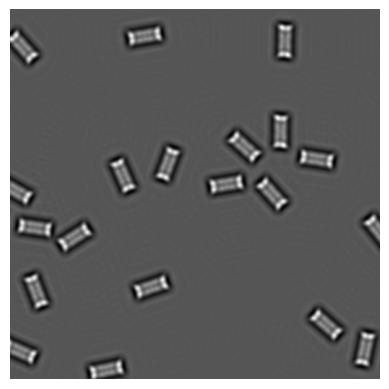

In [ ]:
wavelengths = np.linspace(450e-9, 800e-9, 7)

brightfield_images = []

for wavelength in wavelengths:
    optics = dt.Brightfield(
        resolution=1e-6,
        magnification=12,
        wavelength=wavelength,
        padding=(32, 32, 32, 32),
        output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    )
    image = optics(non_overlap_rods)
    brightfield_images.append(image.resolve())

brightfield_image = (sum(brightfield_images) / len(brightfield_images))
plt.imshow(brightfield_image, cmap="gray")
plt.axis("off")


## Engineered particles: Spheres in Brightfield

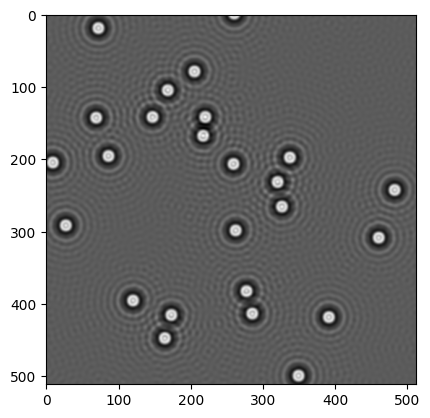

In [9]:
IMAGE_SIZE = 512
radius = 1e-6
length = 4e-6
wavelengths = np.linspace(450e-9, 800e-9, 1)

sphere = dt.Sphere(
    refractive_index = 1.45,
    position=lambda: (
    int(np.random.normal(IMAGE_SIZE / 2, 150)),
    int(np.random.normal(IMAGE_SIZE / 2, 150))
    ),
    radius=radius, 
    z=-10,
)
sphere_cluster = (
    (sphere ^ 35)
    >> dt.Pad(px=(10, 10, 10, 10), keep_size=False)
    >> dt.CropTight()
)
non_overlap_spheres = dt.Store(dt.NonOverlapping(sphere_cluster, min_distance=1, max_attempts=10), key=1)

optics = dt.Brightfield(
        resolution=1e-6,
        magnification=12,
        wavelength=532e-9,
        padding=(32, 32, 32, 32),
        output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    )
test_image=optics(non_overlap_spheres).resolve()
plt.imshow(test_image, cmap="gray")

## Image with white light

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

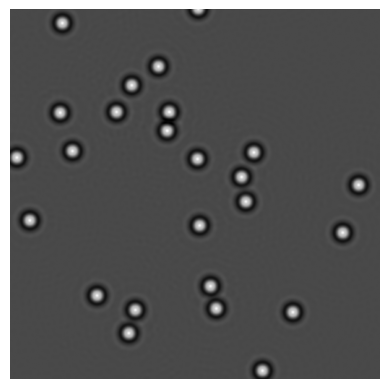

In [10]:
wavelengths = np.linspace(450e-9, 800e-9, 7)

brightfield_images = []

for wavelength in wavelengths:
    optics = dt.Brightfield(
        resolution=1e-6,
        magnification=12,
        wavelength=wavelength,
        padding=(32, 32, 32, 32),
        output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
    )
    image = optics(non_overlap_spheres)
    brightfield_images.append(image.resolve())

brightfield_image = (sum(brightfield_images) / len(brightfield_images))
plt.imshow(brightfield_image, cmap="gray")
plt.axis("off")


## Engineered Particles: Janus Particles in Fluorescence
(Haven't managed to get dt.Nonoverlapping to work with combined spheres)

(np.float64(-0.5), np.float64(255.5), np.float64(255.5), np.float64(-0.5))

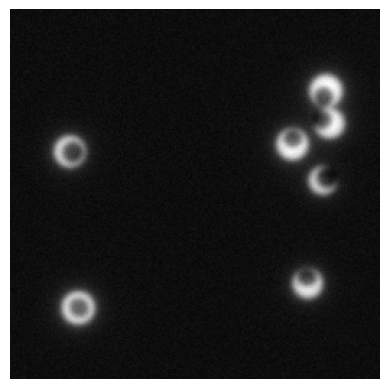

In [ ]:
outer = dt.Sphere(
    position=lambda: np.random.uniform(30, 230, 2) * dt.units.pixel,
    radius=lambda: np.random.uniform(0.5e-6, 0.6e-6),
    refractive_index=1.42,
    position_unit="pixel",
    L=10,
    rotation=lambda: np.random.uniform(0, np.pi)
)
offset = dt.Value(value=lambda: np.random.uniform(-5, 5, 2))
inner = dt.Ellipsoid(
    position=outer.position + offset * dt.units.pixel ,
    radius=lambda:np.random.uniform(0.3e-6, 0.4e-6, 2),
    refractive_index=1.42,
    position_unit="pixel",
    L=10,
    rotation=outer.rotation + np.pi/2,
    intensity=lambda: np.random.uniform(-1.2, -1.3),
)

combined = inner >> outer
particles = combined ^ 7

img = (
    fluorescence_optics(particles) 
    >> dt.Poisson(snr=100)
    >> dt.Gaussian(0, 0.007)
).resolve()
plt.imshow(img, cmap="gray")
plt.axis("off")

# Make Bacterium Figure
Utilize the Bacillus and Streptobacillus class from deeptrack tutorial DTGS_bacterium

In [11]:
class Bacillus(VolumeScatterer):
    __conversion_table__ = ConversionTable(
        radius=(u.meter, u.meter),
        length=(u.meter, u.meter),
        rotation=(u.radian, u.radian),
    )

    def __init__(
            self,
            radius=0.5e-6,
            length=2e-6,
            rotation=(0, 0, 0),
            max_bacillus_bend=0,
            refractive_index=1.38,
            intensity=1,
            **kwargs
        ):
        super().__init__(
            radius=radius,
            length=length,
            rotation=rotation,
            max_bacillus_bend=max_bacillus_bend,
            refractive_index=refractive_index,
            intensity=intensity,
            **kwargs
        )

    def _process_properties(self, properties):
        properties = super()._process_properties(properties)

        # Ensure radius iis scalar
        radius = xp.array(properties["radius"])
        if radius.size > 1:
            radius = radius[0]
        properties["radius"] = float(radius)

        # Ensure length is scalar
        properties["length"] = float(properties["length"])

        # Ensure rotation is 3 values
        rotation = xp.array(properties["rotation"])
        if rotation.ndim == 0:
            rotation = [rotation, 0, 0]
        elif rotation.size == 1:
            rotation = [rotation[0], 0, 0]
        elif rotation.size == 2:
            rotation = [rotation[0], rotation[1], 0]
        properties["rotation"] = tuple(rotation)

        return properties

    def get(
        self,
        *ignore,
        radius,
        length,
        rotation,
        max_bacillus_bend,
        voxel_size,
        **kwargs
    ):

        # Determine grid size
        rad_ceil = xp.ceil(radius / xp.min(voxel_size[:2]))
        len_ceil = xp.ceil(length * 0.5 / voxel_size[2]) + rad_ceil
        ceil = int(max(rad_ceil, len_ceil))

        # Create the grid
        x = xp.arange(-ceil, ceil) * voxel_size[0]
        y = xp.arange(-ceil, ceil) * voxel_size[1]
        z = xp.arange(-ceil, ceil) * voxel_size[2]
        Y, X, Z = xp.meshgrid(y, x, z)

        # Rotate the grid
        cos = xp.cos(rotation)
        sin = xp.sin(rotation)
        XR = (
            cos[0] * cos[1] * X
            + (cos[0] * sin[1] * sin[2] - sin[0] * cos[2]) * Y
            + (cos[0] * sin[1] * cos[2] + sin[0] * sin[2]) * Z
        )
        YR = (
            sin[0] * cos[1] * X
            + (sin[0] * sin[1] * sin[2] + cos[0] * cos[2]) * Y
            + (sin[0] * sin[1] * cos[2] - cos[0] * sin[2]) * Z
        )
        ZR = (-sin[1] * X) + cos[1] * sin[2] * Y + cos[1] * cos[2] * Z

        # Apply wave-like bending along the lenght of the bacillus
        bend_amp_x = (xp.random.rand() - 0.5) * 2 * max_bacillus_bend
        bend_amp_z = (xp.random.rand() - 0.5) * 2 * max_bacillus_bend
        lateral_offset_x = bend_amp_x * xp.cos(xp.pi * YR / length)
        lateral_offset_z = bend_amp_z * xp.cos(xp.pi * YR / length)
        XR -= lateral_offset_x
        ZR -= lateral_offset_z
        
        # Cylinder mask
        cyl_mask = ((XR**2 / radius ** 2 + ZR**2 / radius ** 2) < 1) & (
            xp.abs(YR) < (length / 2)
        )
        # Hemispherical caps
        cap_mask = ((XR**2 + ZR**2 + (xp.abs(YR) - (length/2))**2) < radius**2)

        # Combine the cylinder with the end-caps to form the full bacillus shape
        mask = cyl_mask | cap_mask

        return xp.asarray(mask, dtype=xp.float32)

In [12]:
class Streptobacillus(VolumeScatterer):
    __conversion_table__ = ConversionTable(
        radius=(u.meter, u.meter),
        length=(u.meter, u.meter),
        rotation=(u.radian, u.radian),
    )

    def __init__(
        self,
        radius=0.5e-6,
        length=2e-6,
        n_bacilli=5,
        rotation=(0, 0, 0),
        max_chain_bend=0,
        max_bacillus_bend=0,
        **kwargs
    ):
        super().__init__(
            radius=radius,
            length=length,  # length of each part of the chain
            n_bacilli=n_bacilli,
            rotation=rotation,
            max_chain_bend=max_chain_bend,
            max_bacillus_bend=max_bacillus_bend,
            **kwargs
        )

    def _process_properties(self, properties):
        properties = super()._process_properties(properties)

        # Ensure radius iis scalar
        radius = np.array(properties["radius"])
        if radius.size > 1:
            radius = radius[0]
        properties["radius"] = float(radius)

        # # Ensure length is scalar
        # properties["length"] = float(properties["length"])

        # Ensure length is float or iterable of floats
        length = properties["length"]
        if np.ndim(length) == 0:
            properties["length"] = float(length)
        else:
            properties["length"] = np.array(length, dtype=float)

        # Ensure n_bacilli is int
        properties["n_bacilli"] = int(properties.get("n_bacilli"))

        # Ensure rotation is 3 values
        rotation = np.array(properties["rotation"])
        if rotation.ndim == 0:
            rotation = [rotation, 0, 0]
        elif rotation.size == 1:
            rotation = [rotation[0], 0, 0]
        elif rotation.size == 2:
            rotation = [rotation[0], rotation[1], 0]
        properties["rotation"] = tuple(rotation)

        return properties

    def get(
        self,
        *ignore,
        radius,
        length,
        n_bacilli,
        rotation,
        max_chain_bend,
        max_bacillus_bend,
        voxel_size,
        **kwargs
    ):
        # Determine grid size
        rad_ceil = np.ceil(radius / np.min(voxel_size[:2]))
        len_ceil = (
            np.ceil(length * 0.5 * n_bacilli / voxel_size[2])
            + rad_ceil * n_bacilli
        )
        ceil = int(max(rad_ceil, len_ceil))

        # Create grid
        x = np.arange(-ceil, ceil) * voxel_size[0]
        y = np.arange(-ceil, ceil) * voxel_size[1]
        z = np.arange(-ceil, ceil) * voxel_size[2]
        Y, X, Z = np.meshgrid(y, x, z)

        # Rotate the grid
        cos = np.cos(rotation)
        sin = np.sin(rotation)
        XR = (
            cos[0] * cos[1] * X
            + (cos[0] * sin[1] * sin[2] - sin[0] * cos[2]) * Y
            + (cos[0] * sin[1] * cos[2] + sin[0] * sin[2]) * Z
        )
        YR = (
            sin[0] * cos[1] * X
            + (sin[0] * sin[1] * sin[2] + cos[0] * cos[2]) * Y
            + (sin[0] * sin[1] * cos[2] - cos[0] * sin[2]) * Z
        )
        ZR = (-sin[1] * X) + cos[1] * sin[2] * Y + cos[1] * cos[2] * Z

        shift = length + 2 * radius
        total_length = n_bacilli * (length + 2 * radius)

        mask = np.zeros_like(XR, dtype=bool)

        for i in range(n_bacilli):
            # Chain-level bending offsets
            bend_chain_x = (np.random.rand() - 0.5) * 2 * max_chain_bend
            bend_chain_z = (np.random.rand() - 0.5) * 2 * max_chain_bend

            # Shift chain along Y and apply chain bending
            YR_shifted = YR - i * shift + total_length / 2 - shift / 2
            XR_shifted = XR - bend_chain_x
            ZR_shifted = ZR - bend_chain_z

            # Wave-like bending along the lenght of the bacillus
            bend_amp_x = (np.random.rand() - 0.5) * 2 * max_bacillus_bend
            bend_amp_z = (np.random.rand() - 0.5) * 2 * max_bacillus_bend
            lateral_offset_x = bend_amp_x * np.cos(np.pi * YR_shifted / length)
            lateral_offset_z = bend_amp_z * np.cos(np.pi * YR_shifted / length)
            XR_shifted -= lateral_offset_x
            ZR_shifted -= lateral_offset_z

            # Cylinder mask
            cyl_mask = (
                (XR_shifted**2 / radius**2 + ZR_shifted**2 / radius**2) < 1
            ) & (np.abs(YR_shifted) < length / 2)

            # Hemispherical caps
            cap_mask = (
                XR_shifted**2
                + ZR_shifted**2
                + (np.abs(YR_shifted) - length / 2) ** 2
            ) < radius**2

            # Combine the cylinder with the end-caps
            mask |= cyl_mask | cap_mask

        return mask.astype(float)

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

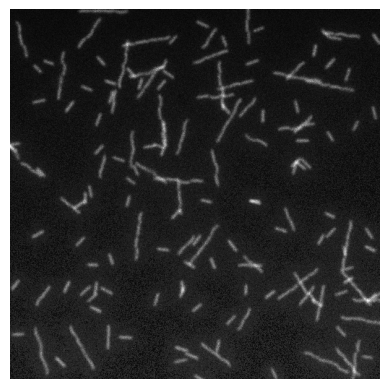

In [127]:
radius = 0.08e-6#0.6e-6
length = .8e-6#3e-6
IMAGE_SIZE = 512

test_optics = dt.Fluorescence(
    NA=1.4,
    resolution=1e-6,
    magnification=18,
    wavelength=600e-9,
    padding=(32, 32, 32, 32),
    output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
)

single_bacterium = Bacillus(
    position=lambda: np.random.uniform(0, 512, 2),
    radius= lambda:np.random.uniform(0.08e-6, 0.1e-6),
    length= lambda: np.random.uniform(.65e-6, .9e-6 ),
    z=0.5,
    rotation=lambda: np.random.rand()*np.pi,
    intensity=1
)

streptobacillus = Streptobacillus(
    position=lambda: np.random.uniform(0, 512, 2),
    n_bacilli=lambda: np.random.randint(2, 5),
    max_chain_bend=.1e-6,
    max_bacillus_bend=0.1e-6,
    radius=radius,
    length=length,
    rotation=lambda: np.random.uniform(0, 2 * np.pi),
    intensity=1.2,
)
bacterium_cluster = (
    (streptobacillus ^ 60)
    >> (single_bacterium ^ 100)
    >> dt.Pad(px=(10, 10, 10, 10), keep_size=False)
    >> dt.CropTight()
)
non_overlapping_bacterium = dt.NonOverlapping(bacterium_cluster, max_attempts=20, min_distance=1)

image = (
   test_optics(non_overlapping_bacterium)
    >> dt.Gaussian(0, 0.00035)
    >> dt.IlluminationGradient((0.000005, 0.00005))
    >> dt.Poisson(snr=5)
    >> dt.Gaussian(0, 0.003)
).resolve()
plt.imshow(image, cmap="gray")
plt.axis("off")

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

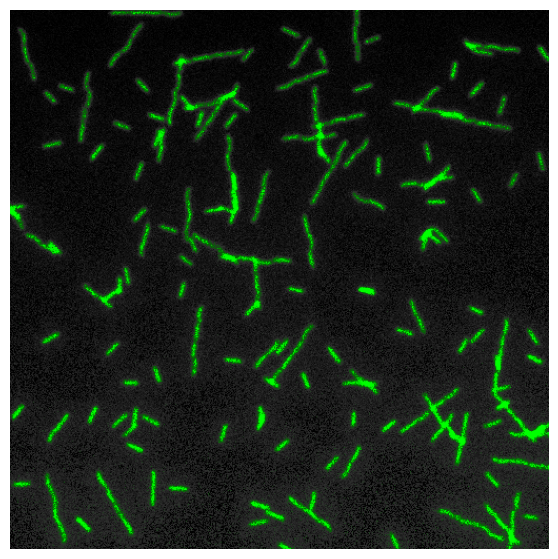

In [137]:
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import Normalize

green_cmap = LinearSegmentedColormap.from_list(
    "fluorescence_green",
    ["#000000", "#303030", "#006600", "#00ff00"]
)

vmin, vmax = np.percentile(image, [5, 99])
fig = plt.figure(figsize=(7, 7))
plt.imshow(
    image,
    cmap=green_cmap,
    norm=Normalize(vmin=vmin, vmax=vmax)
)
plt.axis("off")

# Image a cluster of bacterium.

In [ ]:
np.random.seed(45)
IMAGE_SIZE = 512

x_positions = []
y_positions = []

dx, dy, dz = IMAGE_SIZE//2, IMAGE_SIZE//2, 2
movie_length = 300

radius = 0.1e-6#0.6e-6
length = .9e-6#3e-6

outer = Bacillus(
    refractive_index=1.334,
    position=(dy, dx),
    radius=radius,
    length=length,
    z=0.5,
    rotation=travel_angle+np.pi/2
)

inner = Bacillus(
    refractive_index=1.334,
    position=(dy, dx),
    radius=radius*0.8,
    length=length,
    z=0.5,
    rotation=travel_angle + np.pi/2,
    intensity=-0.4
)

bacterium = (
    inner 
    >> dt.ElasticTransformation(alpha=100, sigma=10, order=1) 
    >> dt.CropTight()
    >>
    outer 
    >> dt.ElasticTransformation(alpha=10, sigma=10, order=1) 
    >> dt.CropTight()
)


fluorescence_image = (
    test_optics(bacterium)
    >> dt.Poisson(snr=30)
    >> dt.Gaussian(0, 0.002)
).resolve()

plt.figure(figsize=(5, 5))
plt.imshow(fluorescence_image, cmap="gray", origin="upper")

plt.plot(
    x_positions,
    y_positions,
    color="yellow",
    lw=0.7,
    alpha=0.5
)
plt.scatter(
    x_positions[0],
    y_positions[0],
    c="blue",
    s=30,
    label="Origin"
)
plt.tick_params(labelleft=False, labelbottom=False)
plt.ylabel("y [Pixel]", fontsize=15)
plt.xlabel("x [Pixel]", fontsize=15)
plt.legend(
    loc="upper left",
    fontsize=12
)
plt.tight_layout()
plt.savefig(
    "fluorescent_bacterium.svg",
    format="svg",
    bbox_inches="tight",
    pad_inches=0.2
)
plt.show()

# WIP: Simulate Bacterium with active brownian motion and make a movie

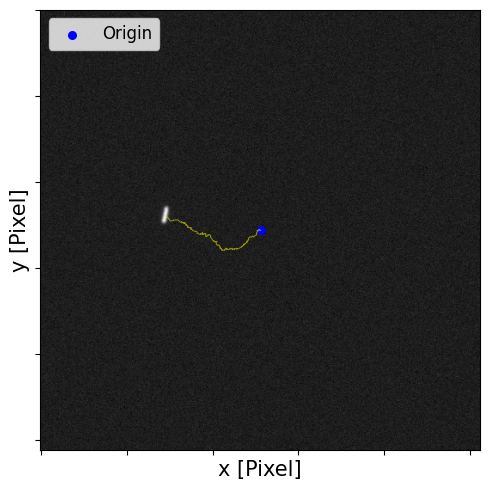

In [ ]:
random_seed =42
IMAGE_SIZE = 512

x_positions = []
y_positions = []

dx, dy, dz = IMAGE_SIZE//2, IMAGE_SIZE//2, 2
movie_length = 300

velocity = 0.4
theta = np.random.uniform(0, 2*np.pi)
rotational_diffusion = 0.08
translational_diffusion = 0.5



x_positions, y_positions, dx, dy, dz = simulate_active_brownian_trajectories(
        random_seed=random_seed,
        IMAGE_SIZE=IMAGE_SIZE,
        length=movie_length,
        velocity=velocity,
        rotational_diffusion=rotational_diffusion,
        translational_diffusion=translational_diffusion,

    )
# Get final angle.
travel_angle = np.arctan2(
    y_positions[-1] - y_positions[-2],
    x_positions[-1] - x_positions[-2]
)

radius = 0.1e-6#0.6e-6
length = .9e-6#3e-6

outer = Bacillus(
    refractive_index=1.334,
    position=(dy, dx),
    radius=radius,
    length=length,
    z=0.5,
    rotation=travel_angle+np.pi/2
)

inner = Bacillus(
    refractive_index=1.334,
    position=(dy, dx),
    radius=radius*0.8,
    length=length,
    z=0.5,
    rotation=travel_angle + np.pi/2,
    intensity=-0.4
)

bacterium = (
    inner 
    >> dt.ElasticTransformation(alpha=100, sigma=10, order=1) 
    >> dt.CropTight()
    >>
    outer 
    >> dt.ElasticTransformation(alpha=10, sigma=10, order=1) 
    >> dt.CropTight()
)
fluorescence_image = (
    test_optics(bacterium)
    >> dt.Poisson(snr=30)
    >> dt.Gaussian(0, 0.002)
).resolve()

plt.figure(figsize=(5, 5))
plt.imshow(fluorescence_image, cmap="gray", origin="upper")

plt.plot(
    x_positions,
    y_positions,
    color="yellow",
    lw=0.7,
    alpha=0.5
)
plt.scatter(
    x_positions[0],
    y_positions[0],
    c="blue",
    s=30,
    label="Origin"
)
plt.tick_params(labelleft=False, labelbottom=False)
plt.ylabel("y [Pixel]", fontsize=15)
plt.xlabel("x [Pixel]", fontsize=15)
plt.legend(
    loc="upper left",
    fontsize=12
)
plt.tight_layout()
plt.savefig(
    "fluorescent_bacterium.svg",
    format="svg",
    bbox_inches="tight",
    pad_inches=0.2
)
plt.show()

## Make an animation from the simulation.
Using `FuncAnimation` and a `HTML` player, we will combine the simulated frames into a movie.

`angular_inertia` controls the turning rate to smooth out instantaneous changes in angle.

In [ ]:
import matplotlib as mpl
mpl.rcParams["animation.embed_limit"] = 100
simulated_movie = []

radius = 0.1e-6
length = .8e-6
movie_length = 30

bacterium_angle = np.arctan2(
    y_positions[1] - y_positions[0],
    x_positions[1] - x_positions[0]
)

angular_inertia = 0.05

for t in range(movie_length):

    dx_t = x_positions[t]
    dy_t = y_positions[t]

    if t > 0:
        velocity_angle = np.arctan2(
            y_positions[t] - y_positions[t-1],
            x_positions[t] - x_positions[t-1]
        )

        angle_difference = np.arctan2(
            np.sin(velocity_angle - bacterium_angle),
            np.cos(velocity_angle - bacterium_angle)
        )

        bacterium_angle +=  angle_difference * angular_inertia

    travel_angle = bacterium_angle

    outer = Bacillus(
        refractive_index=1.334,
        position=(dy_t, dx_t),
        radius=radius,
        length=length,
        z=0.5,
        rotation=travel_angle
    )

    inner = Bacillus(
        refractive_index=1.334,
        position=(dy_t, dx_t),
        radius=radius*0.8,
        length=length,
        z=0.5,
        rotation=travel_angle,
        intensity=-0.4
    )

    bacterium = (
        inner
        >> dt.ElasticTransformation(alpha=100, sigma=10, order=1)
        >> dt.CropTight()
        >>
        outer
        >> dt.ElasticTransformation(alpha=10, sigma=10, order=1)
        >> dt.CropTight()
    )

    frame = (
        test_optics(bacterium)
        >> dt.Gaussian(0, 0.01)
        >> dt.Poisson(snr=30)
    ).resolve()

    simulated_movie.append(frame)

fig, ax = plt.subplots(figsize=(6, 6))

def update(frame):

    ax.clear()
    ax.set_axis_off()

    ax.imshow(
        simulated_movie[frame],
        cmap="gray",
        origin="upper"
    )

    ax.plot(
        x_positions[:frame+1],
        y_positions[:frame+1],
        color="yellow",
        lw=0.8,
        alpha=0.5,
    )


    ax.set_xlim(0, IMAGE_SIZE)
    ax.set_ylim(IMAGE_SIZE, 0)

    return ax,

animation = FuncAnimation(
    fig,
    update,
    frames=len(simulated_movie),
    interval=50,
    blit=False
)

player = HTML(animation.to_jshtml(fps=20))
plt.close()
player

# Make Plankton
from Harshith Bachimanchi
https://github.com/softmatterlab/Deep-learning-in-plankton-ecology/blob/main/segmentation-tutorials/4-simulating_planktons.ipynb

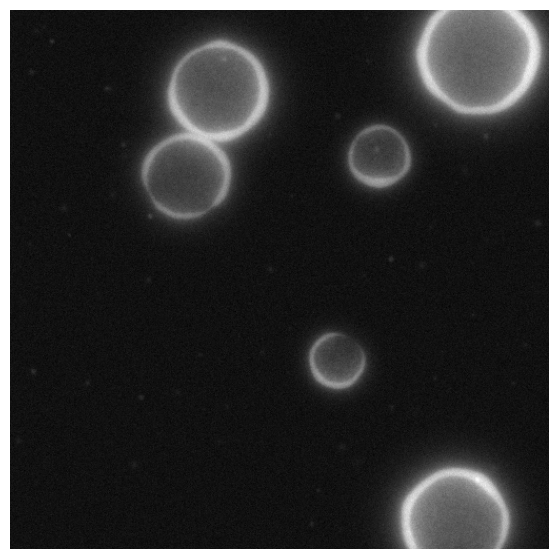

In [34]:
# Define the final image size
IMAGE_SIZE = 512
np.random.seed(44)

# Define the number of Dunaliealla and Noctiluca in the image
point_particles_in_image = lambda: np.random.randint(60, 70)
spheres_in_image = lambda: np.random.randint(6, 7)

# Define the optical system
optics = dt.Fluorescence(
    wavelength=500e-9,
    NA=1.2,
    resolution=1e-6,
    magnification=7,
    refractive_index_medium=1.33,
    output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
)

# Define point particles that represent plankton species, Dunaliella tertiolecta
point_particles = dt.Sphere(
    position=lambda: np.random.uniform(0, IMAGE_SIZE, 2),
    radius=lambda: np.random.uniform(0.2e-6, 0.4e-6),
    intensity=lambda: np.random.uniform(1, 1.5),
    z=lambda: np.random.uniform(-5, 5),
)

# Define inner spheres that represent plankton species, Noctiluca scintillans
inner_spheres = dt.Sphere(
    position=lambda: np.random.uniform(10, IMAGE_SIZE-10, 2),
    radius=lambda: np.random.uniform(3e-6, 8e-6),
    intensity=lambda: -1 * np.random.uniform(0.8, 1.2),
)

# Define outer spheres that represent plankton species, Noctiluca scintillans
outer_spheres = dt.Sphere(
    position=inner_spheres.position,
    radius=inner_spheres.radius * 1.17,
    intensity=inner_spheres.intensity * -1,
)

# Combine the inner and outer spheres to create a single plankton species
combined_spheres = inner_spheres >> outer_spheres

# Define the transformations applied to the point particles (Dunaliella tertiolecta)
point_cells = (
    (point_particles ^ point_particles_in_image)
    >> dt.Pad(px=(5, 5, 5, 5))
    >> dt.ElasticTransformation(alpha=50, sigma=8, order=1)
    >> dt.CropTight()
    >> dt.Poisson(snr=3)
    # You can add more transformations here
)

# Define the transformations applied to the spheres (Noctiluca scintillans)
spherical_cells = (
    (combined_spheres ^ spheres_in_image)
    >> dt.Pad(px=(5, 5, 5, 5))
    >> dt.ElasticTransformation(alpha=50, sigma=8, order=1)
    >> dt.CropTight()
    >> dt.Poisson(snr=3)
    # You can add more transformations here
)

# Normalize the images: For noise approriate level of noise in the next step
normalization = dt.NormalizeMinMax(
    min=lambda: np.random.rand() * 0.4,
    max=lambda min: min + 0.1 + np.random.rand() * 0.5,
)

# Add Poisson noise to the image
noise = dt.Poisson(snr=lambda: np.random.uniform(30, 40), background=normalization.min)

# Define the final sample
sample = optics(point_cells & spherical_cells) >> normalization >> noise
# Plot some example simulated images and masks
im = sample.update()()

fig = plt.figure(figsize=(7, 7))
plt.imshow(im, cmap="gray")
plt.axis("off")
plt.show()